In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.lines import Line2D

In [16]:
df = pd.read_excel('../data/credit-card_customers.xlsx')

In [17]:
df.head()

,Customer_Number,Attrition_Flag,Age,Date_of_birth,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,3708092208,Existing Customer,45,1979-06-09,F,3,High School,Married,Less than $40K,Blue,...,3,3,3544.0,1661,1883.0,0.831,15149,111,0.734,0.469
1,3708093408,Attrited Customer,58,1966-05-28,M,0,Unknown,Single,$40K - $60K,Blue,...,1,3,3421.0,2517,904.0,0.992,992,21,0.400,0.736
2,3708094683,Attrited Customer,46,1978-06-29,M,3,Doctorate,Divorced,$80K - $120K,Blue,...,3,3,8258.0,1771,6487.0,0.000,1447,23,0.000,0.214
3,3708095583,Existing Customer,34,1990-06-23,F,2,Uneducated,Single,Less than $40K,Blue,...,2,2,1438.3,0,1438.3,0.827,3940,82,0.952,0.000
4,3708097083,Existing Customer,49,1975-03-12,F,2,Uneducated,Married,Unknown,Blue,...,5,2,3128.0,749,2379.0,0.598,4369,59,0.735,0.239


In [18]:
df.describe()

,Customer_Number,Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.212600e+04,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000,12126.000000
mean,3.742948e+09,46.729672,2.344302,35.842570,3.810407,2.347188,2.452251,8268.303224,1178.020122,7231.967829,0.758461,4385.389494,64.732806,0.709325,0.288685
std,3.786269e+07,12.508319,1.289627,7.959591,1.552042,1.008596,1.104960,8964.526988,820.392423,8986.507104,0.220927,3382.962202,23.558367,0.237589,0.286073
min,3.708092e+09,5.000000,0.000000,13.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,3.713645e+09,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2454.500000,465.000000,1197.000000,0.628000,2144.250000,45.000000,0.579000,0.026000
50%,3.719272e+09,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4182.000000,1293.000000,3224.000000,0.735000,3891.000000,67.000000,0.700000,0.187000
75%,3.779080e+09,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10572.000000,1800.000000,9575.000000,0.859000,4739.000000,81.000000,0.818000,0.539000
max,3.828353e+09,120.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12126 entries, 0 to 12125
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Customer_Number           12126 non-null  int64         
 1   Attrition_Flag            12026 non-null  object        
 2   Age                       12126 non-null  int64         
 3   Date_of_birth             12126 non-null  datetime64[ns]
 4   Gender                    11926 non-null  object        
 5   Dependent_count           12126 non-null  int64         
 6   Education_Level           11926 non-null  object        
 7   Marital_Status            12126 non-null  object        
 8   Income_Category           12126 non-null  object        
 9   Card_Category             11924 non-null  object        
 10  Months_on_book            12126 non-null  int64         
 11  Total_Relationship_Count  12126 non-null  int64         
 12  Months_Inactive_12

In [20]:
df.isna().sum()

Customer_Number               0
Attrition_Flag              100
Age                           0
Date_of_birth                 0
Gender                      200
Dependent_count               0
Education_Level             200
Marital_Status                0
Income_Category               0
Card_Category               202
Months_on_book                0
Total_Relationship_Count      0
Months_Inactive_12_mon        0
Contacts_Count_12_mon         0
Credit_Limit                  0
Total_Revolving_Bal           0
Avg_Open_To_Buy               0
Total_Amt_Chng_Q4_Q1          0
Total_Trans_Amt               0
Total_Trans_Ct                0
Total_Ct_Chng_Q4_Q1           0
Avg_Utilization_Ratio         0
dtype: int64

In [21]:
(df == 'Unknown').sum()

Customer_Number                0
Attrition_Flag               100
Age                            0
Date_of_birth                  0
Gender                         0
Dependent_count                0
Education_Level             1747
Marital_Status               888
Income_Category             1337
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [22]:
df = df.astype({col: 'string' for col in df.select_dtypes(include='object').columns})

In [36]:
duplicates = df[df.duplicated(subset='Customer_Number', keep=False)]
pd.set_option('display.width', None)
def has_differences(group):
    # Check if any column (except 'Column1') has more than one unique value
    for col in group.columns[1:]:  # Skip the first column
        if group[col].nunique() > 1:
            return True  # There are differences
    return False

# Group by 'Column1' and filter groups where there are differences
duplicate_groups_with_differences = duplicates.groupby('Customer_Number').filter(has_differences)

# Step 3: Print the result
print("Duplicate groups with differences in other columns:")
print(duplicate_groups_with_differences)

Duplicate groups with differences in other columns:
Empty DataFrame
Columns: [Customer_Number, Attrition_Flag, Age, Date_of_birth, Gender, Dependent_count, Education_Level, Marital_Status, Income_Category, Card_Category, Months_on_book, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio]
Index: []

[0 rows x 22 columns]


In [37]:
df = df.drop_duplicates(subset='Customer_Number', keep='first')
duplicates = df[df.duplicated(subset='Customer_Number', keep=False)]
print(duplicates)

Empty DataFrame
Columns: [Customer_Number, Attrition_Flag, Age, Date_of_birth, Gender, Dependent_count, Education_Level, Marital_Status, Income_Category, Card_Category, Months_on_book, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio]
Index: []

[0 rows x 22 columns]


In [38]:
df.dtypes

Customer_Number                      int64
Attrition_Flag                      string
Age                                  int64
Date_of_birth               datetime64[ns]
Gender                              string
Dependent_count                      int64
Education_Level                     string
Marital_Status                      string
Income_Category                     string
Card_Category                       string
Months_on_book                       int64
Total_Relationship_Count             int64
Months_Inactive_12_mon               int64
Contacts_Count_12_mon                int64
Credit_Limit                       float64
Total_Revolving_Bal                  int64
Avg_Open_To_Buy                    float64
Total_Amt_Chng_Q4_Q1               float64
Total_Trans_Amt                      int64
Total_Trans_Ct                       int64
Total_Ct_Chng_Q4_Q1                float64
Avg_Utilization_Ratio              float64
dtype: object

In [39]:
df_sorted = df.sort_values(by=['Attrition_Flag', 'Age', 'Date_of_birth', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'], ascending=[True, True, True, True, True, True, True, True, True], na_position='last')

In [40]:
df_sorted.head()

,Customer_Number,Attrition_Flag,Age,Date_of_birth,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9400,3780134489,Attrited Customer,5,2009-03-08,F,3,Uneducated,Married,Less than $40K,Blue,...,3,3,2745.0,2463,282.0,0.643,2466,39,0.345,0.897
12113,3828067520,Attrited Customer,5,2009-03-08,F,3,Uneducated,Married,Less than $40K,Blue,...,3,3,2745.0,2463,282.0,0.643,2466,39,0.345,0.897
5716,3718555812,Attrited Customer,5,2009-06-24,F,3,Unknown,Married,Less than $40K,Blue,...,4,6,2279.0,1837,442.0,0.853,2789,52,0.677,0.806
10389,3792394887,Attrited Customer,5,2009-06-24,F,3,Unknown,Married,Less than $40K,Blue,...,4,6,2279.0,1837,442.0,0.853,2789,52,0.677,0.806
268,3708621873,Attrited Customer,6,2010-02-06,M,4,High School,Married,Less than $40K,Blue,...,3,3,7769.0,0,7769.0,0.943,8109,74,0.762,0.000


In [41]:
dataset = df_sorted.drop_duplicates(subset=['Attrition_Flag', 'Age', 'Date_of_birth', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'], keep='first')

In [42]:
dataset.isna().sum()

Customer_Number               0
Attrition_Flag               50
Age                           0
Date_of_birth                 0
Gender                      100
Dependent_count               0
Education_Level             100
Marital_Status                0
Income_Category               0
Card_Category               101
Months_on_book                0
Total_Relationship_Count      0
Months_Inactive_12_mon        0
Contacts_Count_12_mon         0
Credit_Limit                  0
Total_Revolving_Bal           0
Avg_Open_To_Buy               0
Total_Amt_Chng_Q4_Q1          0
Total_Trans_Amt               0
Total_Trans_Ct                0
Total_Ct_Chng_Q4_Q1           0
Avg_Utilization_Ratio         0
dtype: int64

In [43]:
(dataset == 'Unknown').sum()

Customer_Number                0
Attrition_Flag                50
Age                            0
Date_of_birth                  0
Gender                         0
Dependent_count                0
Education_Level             1587
Marital_Status               791
Income_Category             1188
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [44]:
dataset = dataset.fillna('Unknown')

In [45]:
dataset.isna().sum()

Customer_Number             0
Attrition_Flag              0
Age                         0
Date_of_birth               0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [46]:
print((dataset == 'Unknown').sum())

Customer_Number                0
Attrition_Flag               100
Age                            0
Date_of_birth                  0
Gender                       100
Dependent_count                0
Education_Level             1687
Marital_Status               791
Income_Category             1188
Card_Category                101
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64


In [47]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10712 entries, 9400 to 7470
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Customer_Number           10712 non-null  int64         
 1   Attrition_Flag            10712 non-null  string        
 2   Age                       10712 non-null  int64         
 3   Date_of_birth             10712 non-null  datetime64[ns]
 4   Gender                    10712 non-null  string        
 5   Dependent_count           10712 non-null  int64         
 6   Education_Level           10712 non-null  string        
 7   Marital_Status            10712 non-null  string        
 8   Income_Category           10712 non-null  string        
 9   Card_Category             10712 non-null  string        
 10  Months_on_book            10712 non-null  int64         
 11  Total_Relationship_Count  10712 non-null  int64         
 12  Months_Inactive_

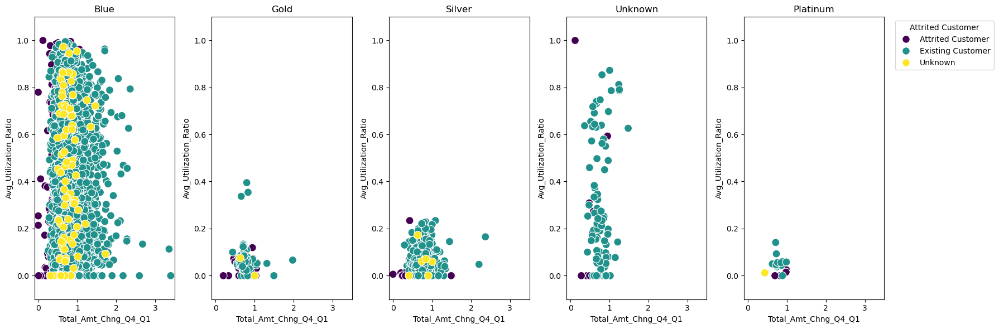

In [48]:
fig, axes = plt.subplots(1, 5, figsize=(18, 6))

# Create a scatter plot for each customer type
customer_types = dataset['Card_Category'].unique()  # Get unique attrition flags

# Define consistent limits for axes
x_limits = (dataset['Total_Amt_Chng_Q4_Q1'].min() - 0.1, dataset['Total_Amt_Chng_Q4_Q1'].max() + 0.1)
y_limits = (dataset['Avg_Utilization_Ratio'].min() - 0.1, dataset['Avg_Utilization_Ratio'].max() + 0.1)

# Create a colormap based on Card_Category
card_categories = dataset['Attrition_Flag'].unique()
colors = cm.viridis(np.linspace(0, 1, len(card_categories)))  # You can choose any colormap you like

for ax, customer_type in zip(axes, customer_types):
    # Filter the DataFrame for the current customer type
    subset = dataset[dataset['Card_Category'] == customer_type]
    
    # Map colors to card categories
    color_map = {category: colors[idx] for idx, category in enumerate(card_categories)}
    scatter_colors = subset['Attrition_Flag'].map(color_map)
    
    # Create scatter plot
    sns.scatterplot(data=subset, 
                    x='Total_Amt_Chng_Q4_Q1', 
                    y='Avg_Utilization_Ratio', 
                    ax=ax, 
                    s=100,
                    c=scatter_colors)
    
    # Set title and labels
    ax.set_title(f'{customer_type}')
    ax.set_xlabel('Total_Amt_Chng_Q4_Q1')
    ax.set_ylabel('Avg_Utilization_Ratio')

    # Set consistent limits for all subplots
    ax.set_xlim(x_limits)
    ax.set_ylim(y_limits)

# Create a legend for card categories
legend_lines = []
for idx, category in enumerate(card_categories):
    # Use the color map to create a legend entry
    legend_lines.append(Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[idx], markersize=10, label=category))

plt.legend(handles=legend_lines, title='Attrited Customer', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

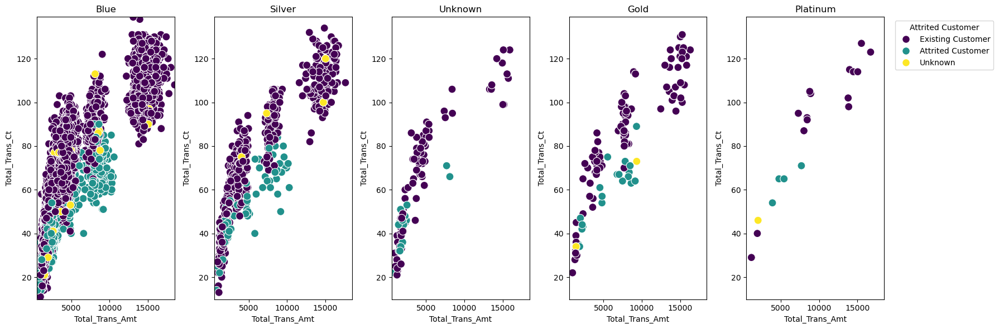

In [17]:
fig, axes = plt.subplots(1, 5, figsize=(18, 6))

# Create a scatter plot for each customer type
customer_types = dataset['Card_Category'].unique()  # Get unique attrition flags

# Define consistent limits for axes
x_limits = (dataset['Total_Trans_Amt'].min() - 0.1, dataset['Total_Trans_Amt'].max() + 0.1)
y_limits = (dataset['Total_Trans_Ct'].min() - 0.1, dataset['Total_Trans_Ct'].max() + 0.1)

# Create a colormap based on Card_Category
card_categories = dataset['Attrition_Flag'].unique()
colors = cm.viridis(np.linspace(0, 1, len(card_categories)))  # You can choose any colormap you like

for ax, customer_type in zip(axes, customer_types):
    # Filter the DataFrame for the current customer type
    subset = dataset[dataset['Card_Category'] == customer_type]
    
    # Map colors to card categories
    color_map = {category: colors[idx] for idx, category in enumerate(card_categories)}
    scatter_colors = subset['Attrition_Flag'].map(color_map)
    
    # Create scatter plot
    sns.scatterplot(data=subset, 
                    x='Total_Trans_Amt', 
                    y='Total_Trans_Ct', 
                    ax=ax, 
                    s=100,
                    c=scatter_colors)
    
    # Set title and labels
    ax.set_title(f'{customer_type}')
    ax.set_xlabel('Total_Trans_Amt')
    ax.set_ylabel('Total_Trans_Ct')

    # Set consistent limits for all subplots
    ax.set_xlim(x_limits)
    ax.set_ylim(y_limits)

# Create a legend for card categories
legend_lines = []
for idx, category in enumerate(card_categories):
    # Use the color map to create a legend entry
    legend_lines.append(Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[idx], markersize=10, label=category))

plt.legend(handles=legend_lines, title='Attrited Customer', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

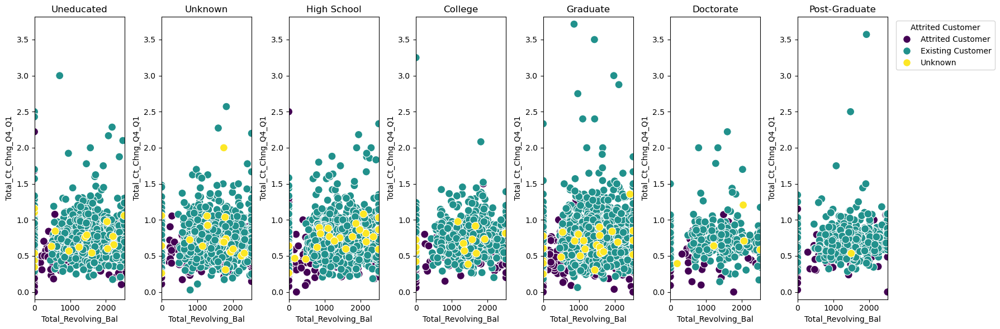

In [50]:
fig, axes = plt.subplots(1, 7, figsize=(18, 6))

# Create a scatter plot for each customer type
customer_types = dataset['Education_Level'].unique()  # Get unique attrition flags

# Define consistent limits for axes
x_limits = (dataset['Total_Revolving_Bal'].min() - 0.1, dataset['Total_Revolving_Bal'].max() + 0.1)
y_limits = (dataset['Total_Ct_Chng_Q4_Q1'].min() - 0.1, dataset['Total_Ct_Chng_Q4_Q1'].max() + 0.1)

# Create a colormap based on Card_Category
card_categories = dataset['Attrition_Flag'].unique()
colors = cm.viridis(np.linspace(0, 1, len(card_categories)))  # You can choose any colormap you like

for ax, customer_type in zip(axes, customer_types):
    # Filter the DataFrame for the current customer type
    subset = dataset[dataset['Education_Level'] == customer_type]
    
    # Map colors to card categories
    color_map = {category: colors[idx] for idx, category in enumerate(card_categories)}
    scatter_colors = subset['Attrition_Flag'].map(color_map)
    
    # Create scatter plot
    sns.scatterplot(data=subset, 
                    x='Total_Revolving_Bal', 
                    y='Total_Ct_Chng_Q4_Q1', 
                    ax=ax, 
                    s=100,
                    c=scatter_colors)
    
    # Set title and labels
    ax.set_title(f'{customer_type}')
    ax.set_xlabel('Total_Revolving_Bal')
    ax.set_ylabel('Total_Ct_Chng_Q4_Q1')

    # Set consistent limits for all subplots
    ax.set_xlim(x_limits)
    ax.set_ylim(y_limits)

# Create a legend for card categories
legend_lines = []
for idx, category in enumerate(card_categories):
    # Use the color map to create a legend entry
    legend_lines.append(Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[idx], markersize=10, label=category))

plt.legend(handles=legend_lines, title='Attrited Customer', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

In [51]:
unique = dataset.nunique()

# Print the unique counts
print(unique)


Customer_Number             10712
Attrition_Flag                  3
Age                            70
Date_of_birth                5741
Gender                          3
Dependent_count                 6
Education_Level                 7
Marital_Status                  4
Income_Category                 6
Card_Category                   5
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6197
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6805
Total_Amt_Chng_Q4_Q1         1156
Total_Trans_Amt              5031
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64


In [52]:
print((dataset == 'Unknown').sum())

Customer_Number                0
Attrition_Flag               100
Age                            0
Date_of_birth                  0
Gender                       100
Dependent_count                0
Education_Level             1687
Marital_Status               791
Income_Category             1188
Card_Category                101
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64


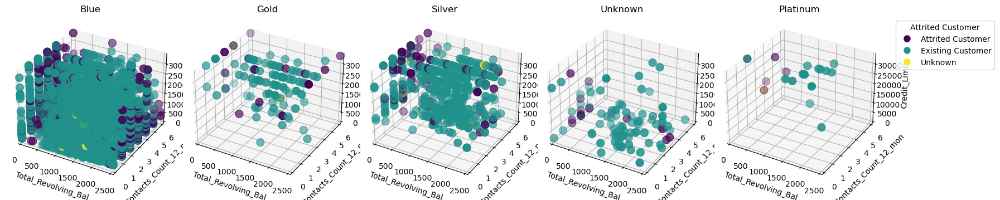

In [53]:
# Set up the figure for 3D plotting
fig = plt.figure(figsize=(18, 6))

# Create a 3D plot for each customer type
customer_types = dataset['Card_Category'].unique()  # Get unique attrition flags

# Define consistent limits for axes
x_limits = (dataset['Total_Revolving_Bal'].min() - 0.1, dataset['Total_Revolving_Bal'].max() + 0.1)
y_limits = (dataset['Contacts_Count_12_mon'].min() - 0.1, dataset['Contacts_Count_12_mon'].max() + 0.1)
z_limits = (dataset['Credit_Limit'].min() - 100, dataset['Credit_Limit'].max() + 100)

# Create a colormap based on Card_Category
card_categories = dataset['Attrition_Flag'].unique()
colors = cm.viridis(np.linspace(0, 1, len(card_categories)))  # You can choose any colormap you like

for i, customer_type in enumerate(customer_types):
    ax = fig.add_subplot(1, 5, i + 1, projection='3d')  # Create a 3D subplot

    # Filter the DataFrame for the current customer type
    subset = dataset[dataset['Card_Category'] == customer_type]

    # Map colors to card categories
    color_map = {category: colors[idx] for idx, category in enumerate(card_categories)}
    scatter_colors = subset['Attrition_Flag'].map(color_map)

    # Create 3D scatter plot
    ax.scatter(subset['Total_Revolving_Bal'], 
               subset['Contacts_Count_12_mon'], 
               subset['Credit_Limit'], 
               s=100,
               c=scatter_colors)  # s is for marker size
    
    # Set labels and title
    ax.set_title(f'{customer_type}')
    ax.set_xlabel('Total_Revolving_Bal')
    ax.set_ylabel('Contacts_Count_12_mon')
    ax.set_zlabel('Credit_Limit')

    # Set consistent limits for all subplots
    ax.set_xlim(x_limits)
    ax.set_ylim(y_limits)
    ax.set_zlim(z_limits)

# Create a legend for card categories
legend_lines = []
for idx, category in enumerate(card_categories):
    # Use the color map to create a legend entry
    legend_lines.append(Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[idx], markersize=10, label=category))

plt.legend(handles=legend_lines, title='Attrited Customer', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

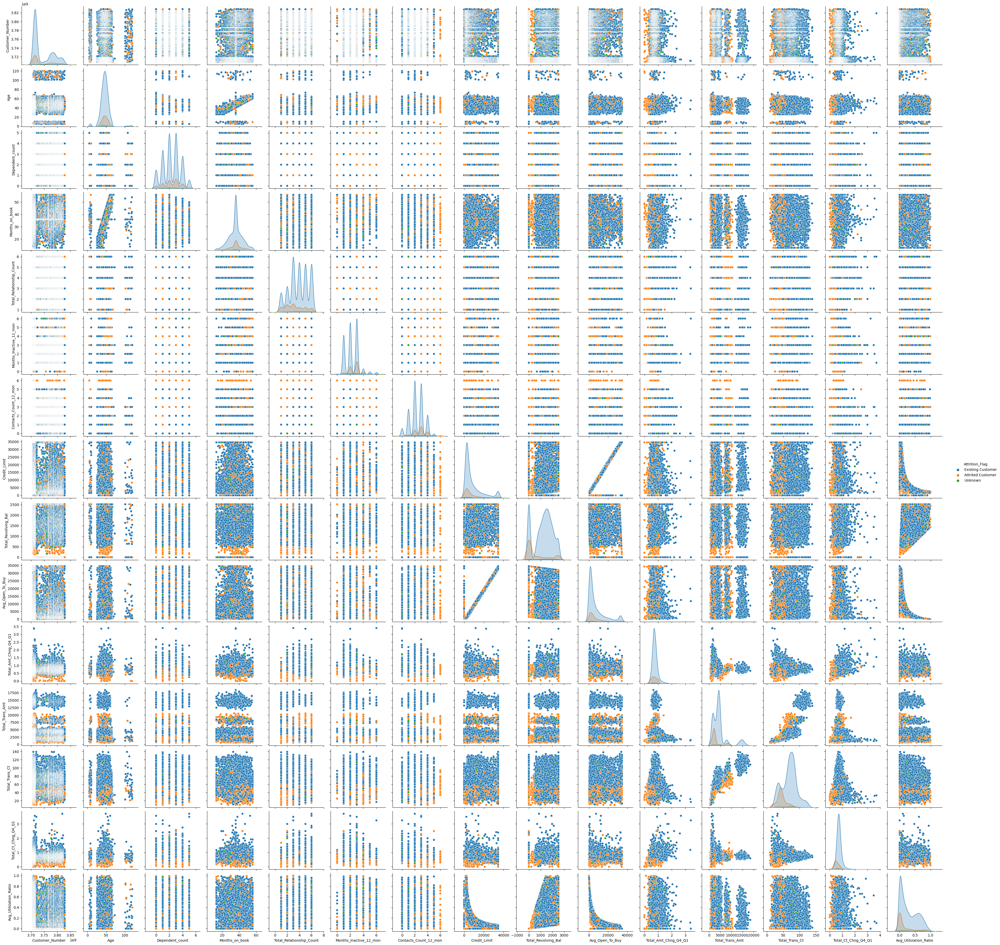

In [157]:
# # Filter numeric columns for the pairplot
# numeric_columns = dataset.select_dtypes(include='number').columns.tolist()

# # Include the 'Attrition_Flag' column in the new DataFrame for the pairplot
# pairplot_data = dataset[numeric_columns + ['Attrition_Flag']]

# Create pairplot using Seaborn
sns.pairplot(dataset, diag_kind='kde', hue='Attrition_Flag')

# Show the plot
plt.show()

In [54]:
dataset.head()

,Customer_Number,Attrition_Flag,Age,Date_of_birth,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9400,3780134489,Attrited Customer,5,2009-03-08,F,3,Uneducated,Married,Less than $40K,Blue,...,3,3,2745.0,2463,282.0,0.643,2466,39,0.345,0.897
5716,3718555812,Attrited Customer,5,2009-06-24,F,3,Unknown,Married,Less than $40K,Blue,...,4,6,2279.0,1837,442.0,0.853,2789,52,0.677,0.806
268,3708621873,Attrited Customer,6,2010-02-06,M,4,High School,Married,Less than $40K,Blue,...,3,3,7769.0,0,7769.0,0.943,8109,74,0.762,0.000
4427,3716067178,Attrited Customer,6,2010-04-13,M,3,College,Married,$60K - $80K,Blue,...,3,2,22599.0,0,22599.0,1.039,4739,55,0.486,0.000
7795,3752997796,Attrited Customer,6,2010-06-17,M,2,Uneducated,Married,$80K - $120K,Blue,...,2,3,20798.0,1059,19739.0,1.049,8038,90,0.837,0.051


In [55]:
dataset = dataset.sort_values(by=['Customer_Number'], ascending=[True])

In [56]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10712 entries, 0 to 12125
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Customer_Number           10712 non-null  int64         
 1   Attrition_Flag            10712 non-null  string        
 2   Age                       10712 non-null  int64         
 3   Date_of_birth             10712 non-null  datetime64[ns]
 4   Gender                    10712 non-null  string        
 5   Dependent_count           10712 non-null  int64         
 6   Education_Level           10712 non-null  string        
 7   Marital_Status            10712 non-null  string        
 8   Income_Category           10712 non-null  string        
 9   Card_Category             10712 non-null  string        
 10  Months_on_book            10712 non-null  int64         
 11  Total_Relationship_Count  10712 non-null  int64         
 12  Months_Inactive_12

In [57]:
# Get the current date
current_date = pd.to_datetime('today')

# Calculate the age by subtracting Date_of_birth from the current date and converting to years
dataset['Age'] = (current_date - dataset['Date_of_birth']).astype('<m8[Y]')

# Verify the result
print(dataset[['Date_of_birth', 'Age']].head())

  Date_of_birth   Age
0    1979-06-09  45.0
1    1966-05-28  58.0
2    1978-06-29  46.0
3    1990-06-23  34.0
4    1975-03-12  49.0


In [58]:
dataset = dataset.drop('Customer_Number', axis=1)

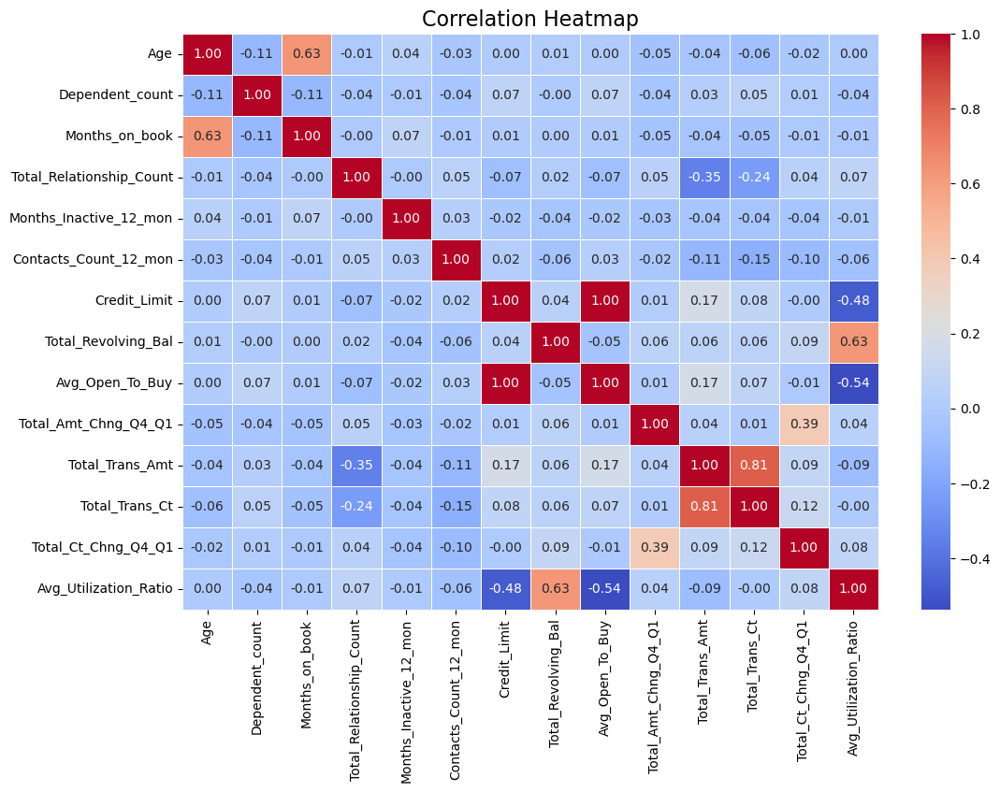

In [59]:
# 1. Select numeric columns
numeric_columns = dataset.select_dtypes(include=['float64', 'int64']).columns

# 2. Compute the correlation matrix
corr_matrix = dataset[numeric_columns].corr()

# 3. Plot the heatmap
plt.figure(figsize=(12, 8))  # Adjust size of the plot
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)

# 4. Display the plot
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

In [60]:
unique = dataset.nunique()

# Print the unique counts
print(unique)

Attrition_Flag                 3
Age                           72
Date_of_birth               5741
Gender                         3
Dependent_count                6
Education_Level                7
Marital_Status                 4
Income_Category                6
Card_Category                  5
Months_on_book                44
Total_Relationship_Count       6
Months_Inactive_12_mon         7
Contacts_Count_12_mon          7
Credit_Limit                6197
Total_Revolving_Bal         1974
Avg_Open_To_Buy             6805
Total_Amt_Chng_Q4_Q1        1156
Total_Trans_Amt             5031
Total_Trans_Ct               126
Total_Ct_Chng_Q4_Q1          830
Avg_Utilization_Ratio        964
dtype: int64


In [61]:
dataset = dataset.drop(['Total_Trans_Ct', 'Credit_Limit', 'Date_of_birth'], axis=1)

In [62]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10712 entries, 0 to 12125
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10712 non-null  string 
 1   Age                       10712 non-null  float64
 2   Gender                    10712 non-null  string 
 3   Dependent_count           10712 non-null  int64  
 4   Education_Level           10712 non-null  string 
 5   Marital_Status            10712 non-null  string 
 6   Income_Category           10712 non-null  string 
 7   Card_Category             10712 non-null  string 
 8   Months_on_book            10712 non-null  int64  
 9   Total_Relationship_Count  10712 non-null  int64  
 10  Months_Inactive_12_mon    10712 non-null  int64  
 11  Contacts_Count_12_mon     10712 non-null  int64  
 12  Total_Revolving_Bal       10712 non-null  int64  
 13  Avg_Open_To_Buy           10712 non-null  float64
 14  Total_

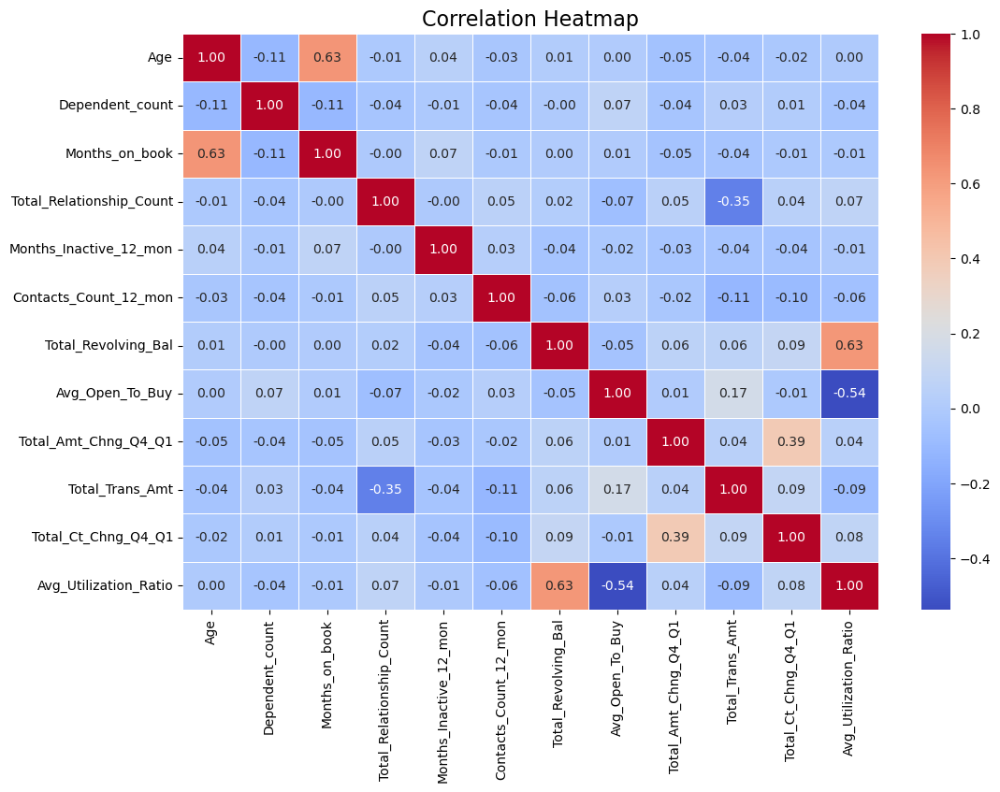

In [63]:
# 1. Select numeric columns
numeric_columns = dataset.select_dtypes(include=['float64', 'int64']).columns

# 2. Compute the correlation matrix
corr_matrix = dataset[numeric_columns].corr()

# 3. Plot the heatmap
plt.figure(figsize=(12, 8))  # Adjust size of the plot
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)

# 4. Display the plot
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

In [64]:
dataset[numeric_columns].describe()

,Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000,10712.000000
mean,46.213686,2.348114,35.891243,3.807972,2.344007,2.452670,1161.102502,7457.006637,0.759272,4410.028286,0.711021,0.274566
std,9.736160,1.293856,7.963285,1.554836,1.008846,1.104814,816.967762,9070.868030,0.219239,3410.763664,0.237669,0.276079
min,10.000000,0.000000,13.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,510.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,300.250000,1328.250000,0.630000,2152.750000,0.581000,0.020000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,1275.000000,3454.000000,0.736000,3895.000000,0.700000,0.175000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,1784.000000,9916.750000,0.859000,4742.000000,0.818000,0.501000
max,120.000000,5.000000,56.000000,6.000000,6.000000,6.000000,2517.000000,34516.000000,3.397000,18484.000000,3.714000,0.999000


In [65]:
# Identify categorical columns
categorical_cols = dataset.select_dtypes(include=['string']).columns.tolist()
categorical_cols = categorical_cols[1:]
print(categorical_cols)
# Convert categorical columns to dummy variables
dummy_dataset = pd.get_dummies(dataset, columns=categorical_cols)

['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


In [66]:
dummy_dataset.head()

,Attrition_Flag,Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Card_Category_Unknown
0,Existing Customer,45.0,3,36,4,3,3,1661,1883.0,0.831,...,0,0,0,1,0,1,0,0,0,0
1,Attrited Customer,58.0,0,45,3,1,3,2517,904.0,0.992,...,1,0,0,0,0,1,0,0,0,0
2,Attrited Customer,46.0,3,38,6,3,3,1771,6487.0,0.000,...,0,0,1,0,0,1,0,0,0,0
3,Existing Customer,34.0,2,24,6,2,2,0,1438.3,0.827,...,0,0,0,1,0,1,0,0,0,0
4,Existing Customer,49.0,2,41,3,5,2,749,2379.0,0.598,...,0,0,0,0,1,1,0,0,0,0


In [67]:
dummy_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10712 entries, 0 to 12125
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Attrition_Flag                  10712 non-null  string 
 1   Age                             10712 non-null  float64
 2   Dependent_count                 10712 non-null  int64  
 3   Months_on_book                  10712 non-null  int64  
 4   Total_Relationship_Count        10712 non-null  int64  
 5   Months_Inactive_12_mon          10712 non-null  int64  
 6   Contacts_Count_12_mon           10712 non-null  int64  
 7   Total_Revolving_Bal             10712 non-null  int64  
 8   Avg_Open_To_Buy                 10712 non-null  float64
 9   Total_Amt_Chng_Q4_Q1            10712 non-null  float64
 10  Total_Trans_Amt                 10712 non-null  int64  
 11  Total_Ct_Chng_Q4_Q1             10712 non-null  float64
 12  Avg_Utilization_Ratio           

In [68]:
dummy_dataset = dummy_dataset.drop(['Income_Category_Unknown', 'Card_Category_Unknown', 'Marital_Status_Unknown', 'Education_Level_Unknown', 'Gender_Unknown'], axis=1)

In [69]:
Unknown_data = dummy_dataset[dataset['Attrition_Flag'] == 'Unknown']
known_dataset = dummy_dataset[dataset['Attrition_Flag'] != 'Unknown']

In [70]:
known_dataset.head()

,Attrition_Flag,Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,Existing Customer,45.0,3,36,4,3,3,1661,1883.0,0.831,...,0,0,0,0,0,1,1,0,0,0
1,Attrited Customer,58.0,0,45,3,1,3,2517,904.0,0.992,...,1,0,1,0,0,0,1,0,0,0
2,Attrited Customer,46.0,3,38,6,3,3,1771,6487.0,0.000,...,0,0,0,0,1,0,1,0,0,0
3,Existing Customer,34.0,2,24,6,2,2,0,1438.3,0.827,...,1,0,0,0,0,1,1,0,0,0
4,Existing Customer,49.0,2,41,3,5,2,749,2379.0,0.598,...,0,0,0,0,0,0,1,0,0,0


In [71]:
known_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10612 entries, 0 to 12125
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Attrition_Flag                  10612 non-null  string 
 1   Age                             10612 non-null  float64
 2   Dependent_count                 10612 non-null  int64  
 3   Months_on_book                  10612 non-null  int64  
 4   Total_Relationship_Count        10612 non-null  int64  
 5   Months_Inactive_12_mon          10612 non-null  int64  
 6   Contacts_Count_12_mon           10612 non-null  int64  
 7   Total_Revolving_Bal             10612 non-null  int64  
 8   Avg_Open_To_Buy                 10612 non-null  float64
 9   Total_Amt_Chng_Q4_Q1            10612 non-null  float64
 10  Total_Trans_Amt                 10612 non-null  int64  
 11  Total_Ct_Chng_Q4_Q1             10612 non-null  float64
 12  Avg_Utilization_Ratio           

In [77]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = known_dataset.drop(columns='Attrition_Flag')  # Features
y = known_dataset['Attrition_Flag'] #Target

# Splitting the dataset
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Initialize the scaler
scaler = StandardScaler()

# Fit on the training set and transform the training data
X_train_scaled = scaler.fit_transform(X_train[numeric_columns])

# Use the same scaler to transform the validation and test sets
X_val_scaled = scaler.transform(X_val[numeric_columns])
X_test_scaled = scaler.transform(X_test[numeric_columns])

In [78]:
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=numeric_columns)
dummy_columns = X_train.columns.difference(numeric_columns)
X_train_dummies_df = X_train[dummy_columns]
X_train_final = pd.concat([X_train_scaled_df.reset_index(drop=True), X_train_dummies_df.reset_index(drop=True)], axis=1)

In [79]:
X_val_scaled_df = pd.DataFrame(X_val_scaled, columns=numeric_columns)
dummy_columns = X_val.columns.difference(numeric_columns)
X_val_dummies_df = X_val[dummy_columns]
X_val_final = pd.concat([X_val_scaled_df.reset_index(drop=True), X_val_dummies_df.reset_index(drop=True)], axis=1)

In [80]:
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=numeric_columns)
dummy_columns = X_test.columns.difference(numeric_columns)
X_test_dummies_df = X_test[dummy_columns]
X_test_final = pd.concat([X_test_scaled_df.reset_index(drop=True), X_test_dummies_df.reset_index(drop=True)], axis=1)

In [81]:
X_train_final = X_train_final.to_numpy()
X_val_final = X_val_final.to_numpy()
X_test_final = X_test_final.to_numpy()

In [82]:
Unknown_data.head()

,Attrition_Flag,Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Marital_Status_Single,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
118,Unknown,35.0,1,25,6,3,2,2001,4052.0,0.743,...,1,0,0,1,0,0,1,0,0,0
122,Unknown,38.0,1,36,1,2,3,1103,1045.0,0.602,...,1,0,1,0,0,0,1,0,0,0
303,Unknown,54.0,4,36,3,2,3,0,13626.0,0.411,...,1,0,0,0,0,1,0,0,0,1
659,Unknown,43.0,2,28,4,2,3,1355,20802.0,0.690,...,0,0,0,1,0,0,1,0,0,0
1217,Unknown,50.0,4,36,6,4,3,0,3862.0,0.578,...,0,0,0,0,0,0,1,0,0,0


In [83]:
X_unknown = Unknown_data.drop('Attrition_Flag', axis=1)
y_unknown = Unknown_data['Attrition_Flag']
X_unknown_scaled = scaler.transform(X_unknown[numeric_columns])
X_unknown_scaled_df = pd.DataFrame(X_unknown_scaled, columns=numeric_columns)
dummy_columns = X_unknown.columns.difference(numeric_columns)
X_unknown_dummies_df = X_unknown[dummy_columns]
X_unknown_final = pd.concat([X_unknown_scaled_df.reset_index(drop=True), X_unknown_dummies_df.reset_index(drop=True)], axis=1)

In [84]:
X_unknown_final = X_unknown_final.to_numpy()

In [85]:
from sklearn.linear_model import LogisticRegression

# Initialize and train the model
model = LogisticRegression()
model.fit(X_train_final, y_train)

LogisticRegression()

In [86]:
# Predict on validation data
y_val_pred = model.predict(X_val_final)

# Calculate performance metrics
from sklearn.metrics import accuracy_score, classification_report

val_accuracy = accuracy_score(y_val, y_val_pred)
print('Validation Accuracy:', val_accuracy)
print('Classification Report:\n', classification_report(y_val, y_val_pred))

Validation Accuracy: 0.8944723618090452
Classification Report:
                    precision    recall  f1-score   support

Attrited Customer       0.82      0.45      0.58       259
Existing Customer       0.90      0.98      0.94      1333

         accuracy                           0.89      1592
        macro avg       0.86      0.72      0.76      1592
     weighted avg       0.89      0.89      0.88      1592



In [134]:
from sklearn.model_selection import GridSearchCV

# Example: Hyperparameter tuning with Grid Search
param_grid = {
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train_final, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Validate the best model
y_val_pred_best = best_model.predict(X_val_final)
print('Best Model Validation Accuracy:', accuracy_score(y_val, y_val_pred_best))

Best Model Validation Accuracy: 0.8932160804020101


In [88]:
# Final evaluation on test data
y_test_pred = best_model.predict(X_test_final)
test_accuracy = accuracy_score(y_test, y_test_pred)
print('Test Accuracy:', test_accuracy)

Test Accuracy: 0.8881909547738693


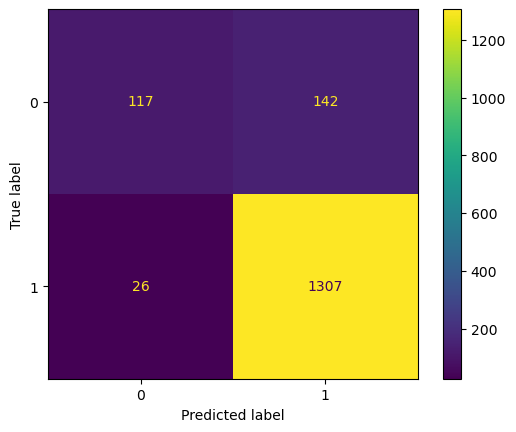

In [89]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_val, y_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [90]:
from sklearn.metrics import classification_report

print(classification_report(y_val, y_val_pred))

                   precision    recall  f1-score   support

Attrited Customer       0.82      0.45      0.58       259
Existing Customer       0.90      0.98      0.94      1333

         accuracy                           0.89      1592
        macro avg       0.86      0.72      0.76      1592
     weighted avg       0.89      0.89      0.88      1592



In [133]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

y_val_binary = (y_val == 'Existing Customer').astype(int)

y_val_proba = model.predict_proba(X_val_final)[:, 1]  # Probabilities for the positive class
fpr, tpr, thresholds = roc_curve(y_val_binary, y_val_proba)
roc_auc = roc_auc_score(y_val, y_val_proba)

plt.figure()
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

AttributeError: 'Sequential' object has no attribute 'predict_proba'

In [135]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'max_iter': [1000, 1500, 2000],
    'solver': ['lbfgs', 'saga']  # Choose solvers that fit your data
}

grid_search_lr = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring='accuracy')
grid_search_lr.fit(X_train_final, y_train)

print("Best parameters found: ", grid_search_lr.best_params_)

Best parameters found:  {'C': 0.1, 'max_iter': 1000, 'solver': 'lbfgs'}


In [136]:
# Get predictions
y_val_pred = grid_search_lr.predict(X_val_final)

# Get predicted probabilities for the positive class
y_val_proba = grid_search_lr.predict_proba(X_val_final)[:, 1]

In [137]:
# Calculate accuracy
accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {accuracy}")

Validation Accuracy: 0.8932160804020101


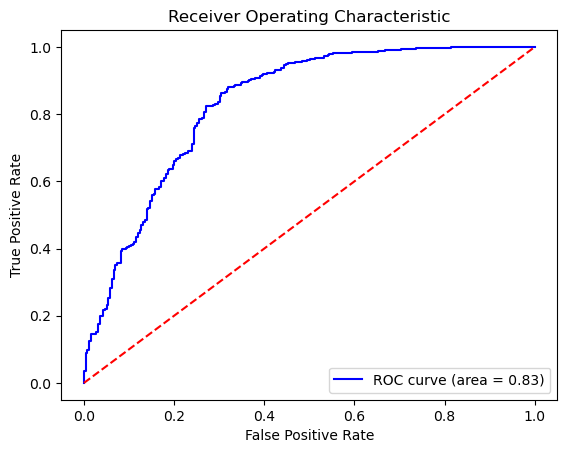

In [138]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_val_binary, y_val_proba)
roc_auc = roc_auc_score(y_val_binary, y_val_proba)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

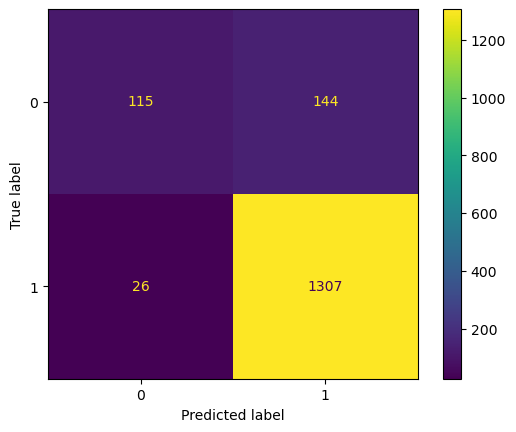

In [139]:
cm = confusion_matrix(y_val, y_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

Test Accuracy: 0.8881909547738693


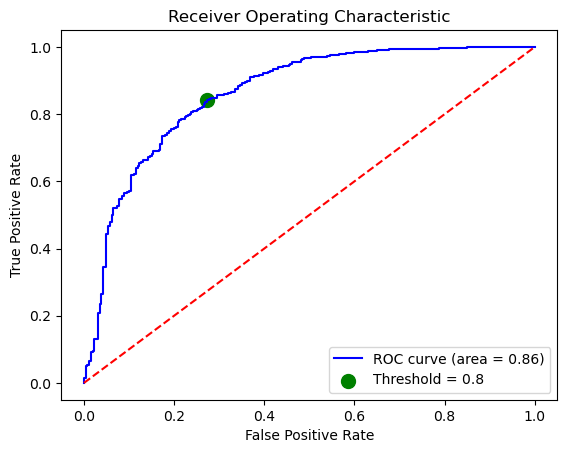

In [140]:
# Get predictions
y_test_pred = grid_search_lr.predict(X_test_final)

# Get predicted probabilities for the positive class
y_test_proba = grid_search_lr.predict_proba(X_test_final)[:, 1]

# Calculate accuracy
accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {accuracy}")

y_test_binary = (y_test == 'Existing Customer').astype(int)
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test_binary, y_test_proba)
roc_auc = roc_auc_score(y_test_binary, y_test_proba)

# Set a custom threshold (adjust this value as needed)
custom_threshold = 0.8

# Find the index of the closest threshold to the custom threshold
threshold_idx = np.argmin(np.abs(thresholds - custom_threshold))

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.scatter(fpr[threshold_idx], tpr[threshold_idx], color='green', label=f'Threshold = {custom_threshold}', s=100)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

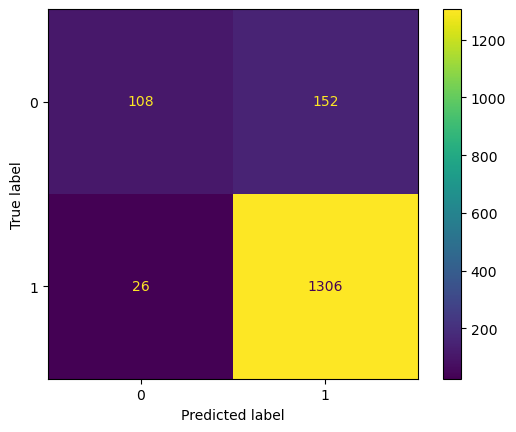

In [141]:
cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [142]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score

# Assuming you already have your model's predicted probabilities
# Get predicted probabilities for the positive class (class 1)
y_test_proba = grid_search_lr.predict_proba(X_test_final)[:, 1]

# Set a custom threshold (e.g., 0.6 to reduce false positives)
custom_threshold = 0.85
y_test_pred_custom = (y_test_proba >= custom_threshold).astype(int)

# Calculate confusion matrix with the new threshold
cm = confusion_matrix(y_test_binary, y_test_pred_custom)
print("Confusion Matrix at threshold", custom_threshold)
print(cm)

# Calculate precision and recall to check the performance
precision = precision_score(y_test_binary, y_test_pred_custom)
recall = recall_score(y_test_binary, y_test_pred_custom)

print(f"Precision at threshold {custom_threshold}: {precision}")
print(f"Recall at threshold {custom_threshold}: {recall}")

Confusion Matrix at threshold 0.85
[[ 206   54]
 [ 303 1029]]
Precision at threshold 0.85: 0.9501385041551247
Recall at threshold 0.85: 0.7725225225225225


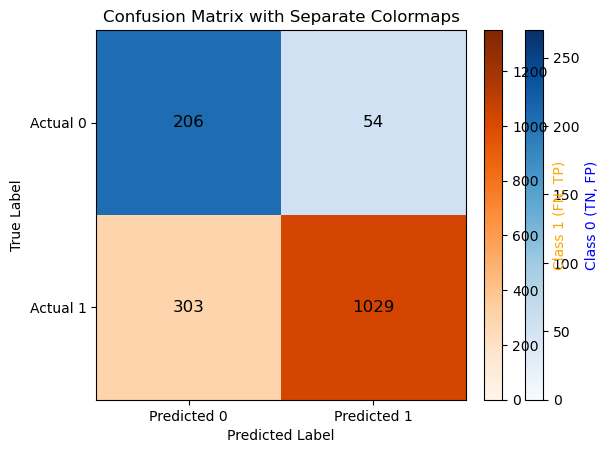

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Assuming y_test_binary and y_test_pred_custom are defined

# Calculate confusion matrix
cm = confusion_matrix(y_test_binary, y_test_pred_custom)

# Manually plot the confusion matrix with separate color maps
fig, ax = plt.subplots()

# Create masks for each class
mask_0 = np.zeros_like(cm, dtype=bool)  # Mask for class 0
mask_1 = np.zeros_like(cm, dtype=bool)  # Mask for class 1

# Apply the mask for class 0 (True Negative, False Positive)
mask_0[0, :] = True

# Apply the mask for class 1 (False Negative, True Positive)
mask_1[1, :] = True

# Plot class 0 with one color map
cmap_0 = plt.cm.Blues
cmap_1 = plt.cm.Oranges

# Plot the confusion matrix for class 0 and class 1
im_0 = ax.imshow(np.ma.masked_where(~mask_0, cm), cmap=cmap_0, vmin=0, vmax=270)
im_1 = ax.imshow(np.ma.masked_where(~mask_1, cm), cmap=cmap_1, vmin=0, vmax=1350)

# Add text annotations (values)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='black', fontsize=12)

# Add a color bar for each class
cbar_0 = fig.colorbar(im_0, ax=ax, fraction=0.046, pad=0.04)
cbar_0.set_label('Class 0 (TN, FP)', color='blue')

cbar_1 = fig.colorbar(im_1, ax=ax, fraction=0.046, pad=0.04)
cbar_1.set_label('Class 1 (FN, TP)', color='orange')

# Set labels, title, and ticks
ax.set_xticks(np.arange(cm.shape[1]))
ax.set_yticks(np.arange(cm.shape[0]))
ax.set_xticklabels(['Predicted 0', 'Predicted 1'])
ax.set_yticklabels(['Actual 0', 'Actual 1'])

plt.title('Confusion Matrix with Separate Colormaps')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Show the plot
plt.show()


In [144]:
Unknown_data = pd.DataFrame(columns=['Attrition_Flag', 'Predicted_Probability'])

# Custom threshold (set your desired threshold, e.g., 0.7)
custom_threshold = 0.85

# Get predicted probabilities for the positive class
probabilities = grid_search_lr.predict_proba(X_unknown_final)[:, 1]  # Probability of the positive class

# Apply the custom threshold: If probability >= custom_threshold, predict 'Attrited Customer', otherwise 'Existing Customer'
Unknown_data['Attrition_Flag'] = np.where(probabilities <= custom_threshold, 'Attrited Customer', 'Existing Customer')

# Add predicted probabilities to the DataFrame for reference
Unknown_data['Predicted_Probability'] = probabilities

# Display the updated DataFrame with the new threshold applied
print(Unknown_data[['Attrition_Flag', 'Predicted_Probability']])


       Attrition_Flag  Predicted_Probability
0   Existing Customer               0.959815
1   Existing Customer               0.863884
2   Attrited Customer               0.123885
3   Existing Customer               0.869467
4   Attrited Customer               0.802432
..                ...                    ...
95  Existing Customer               0.965839
96  Existing Customer               0.921887
97  Existing Customer               0.995131
98  Attrited Customer               0.774683
99  Attrited Customer               0.180450

[100 rows x 2 columns]


Validation Accuracy: 0.94
Classification Report on Validation Set:
                   precision    recall  f1-score   support

Attrited Customer       0.91      0.69      0.78       259
Existing Customer       0.94      0.99      0.96      1333

         accuracy                           0.94      1592
        macro avg       0.93      0.84      0.87      1592
     weighted avg       0.94      0.94      0.93      1592

Confusion Matrix on Validation Set:
[[ 178   81]
 [  17 1316]]
Test Accuracy: 0.95
Classification Report on Test Set:
                   precision    recall  f1-score   support

Attrited Customer       0.94      0.75      0.84       260
Existing Customer       0.95      0.99      0.97      1332

         accuracy                           0.95      1592
        macro avg       0.95      0.87      0.90      1592
     weighted avg       0.95      0.95      0.95      1592

Confusion Matrix on Test Set:
[[ 196   64]
 [  12 1320]]


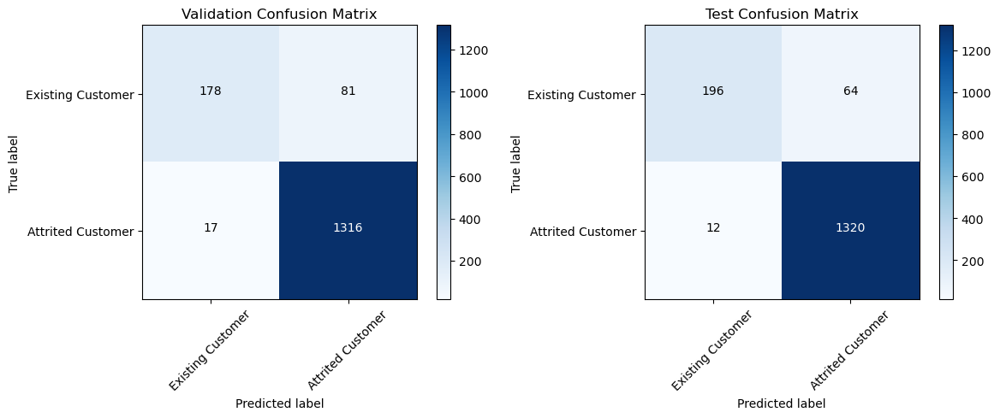

In [123]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 1. Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# 2. Fit the model on the training set
rf_model.fit(X_train_final, y_train)

# 3. Validate the model on the validation set
y_val_pred = rf_model.predict(X_val_final)

# 4. Calculate accuracy and other metrics on the validation set
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy:.2f}")

# Classification report for the validation set
print("Classification Report on Validation Set:")
print(classification_report(y_val, y_val_pred))

# Confusion Matrix for the validation set
val_cm = confusion_matrix(y_val, y_val_pred)
print("Confusion Matrix on Validation Set:")
print(val_cm)

# 5. Test the model on the test set
y_test_pred = rf_model.predict(X_test_final)

# Calculate accuracy and other metrics on the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Classification report for the test set
print("Classification Report on Test Set:")
print(classification_report(y_test, y_test_pred))

# Confusion Matrix for the test set
test_cm = confusion_matrix(y_test, y_test_pred)
print("Confusion Matrix on Test Set:")
print(test_cm)

# Optional: Visualizing the confusion matrix
def plot_confusion_matrix(cm, classes):
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Classes in the target variable
classes = ['Existing Customer', 'Attrited Customer']  # Update based on your target classes

# Plot confusion matrix for validation and test sets
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plot_confusion_matrix(val_cm, classes)
plt.title('Validation Confusion Matrix')

plt.subplot(1, 2, 2)
plot_confusion_matrix(test_cm, classes)
plt.title('Test Confusion Matrix')

plt.show()


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Best Parameters: {'bootstrap': False, 'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Best Cross-Validation Score: 0.95
Validation Accuracy: 0.94
Classification Report on Validation Set:
                   precision    recall  f1-score   support

Attrited Customer       0.92      0.71      0.80       259
Existing Customer       0.95      0.99      0.97      1333

         accuracy                           0.94      1592
        macro avg       0.93      0.85      0.88      1592
     weighted avg       0.94      0.94      0.94      1592

Confusion Matrix on Validation Set:
[[ 185   74]
 [  17 1316]]
Test Accuracy: 0.95
Classification Report on Test Set:
                   precision    recall  f1-score   support

Attrited Customer       0.93      0.77      0.84       260
Existing Customer       0.96      0.99      0.97      1332

         accuracy                           0.95      1592
        macro avg       0.95      0.88 

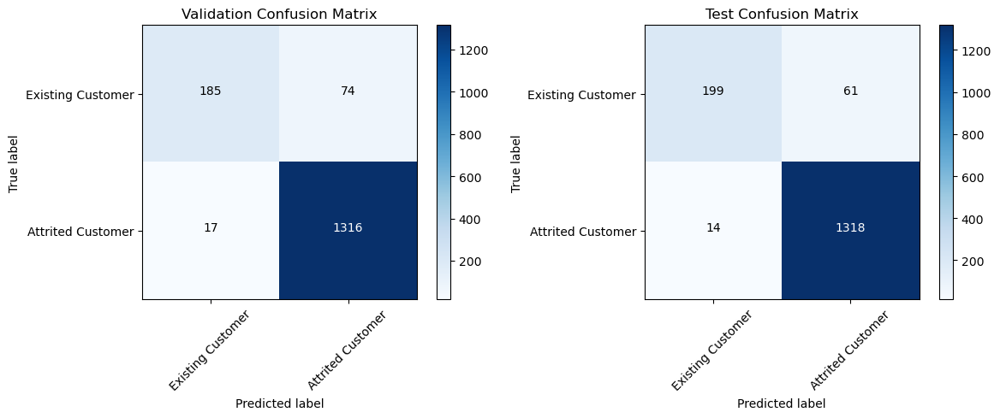

In [130]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV

# Step 1: Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Step 2: Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 150],           # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider at every split
    'max_depth': [None, 10, 20, 30],           # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],             # Minimum number of samples required to be at a leaf node
    'bootstrap': [True, False]                 # Whether bootstrap samples are used when building trees
}

# Step 3: Initialize the Grid Search
grid_search_rf = GridSearchCV(estimator=rf_model,
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=5,                           # 5-fold cross-validation
                           verbose=1,                     # Print out progress
                           n_jobs=-1)                     # Use all available cores

# Step 4: Fit the Grid Search to the training data
grid_search_rf.fit(X_train_final, y_train)

# Get the best parameters and best score
best_params = grid_search_rf.best_params_
best_score = grid_search_rf.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation Score: {best_score:.2f}")

# Step 5: Evaluate the best model on the validation set
best_model_rf = grid_search_rf.best_estimator_
y_val_pred = best_model.predict(X_val_final)

# Calculate accuracy and other metrics on the validation set
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy:.2f}")

# Classification report for the validation set
print("Classification Report on Validation Set:")
print(classification_report(y_val, y_val_pred))

# Confusion Matrix for the validation set
val_cm = confusion_matrix(y_val, y_val_pred)
print("Confusion Matrix on Validation Set:")
print(val_cm)

# Test the best model on the test set
y_test_pred = best_model_rf.predict(X_test_final)

# Calculate accuracy and other metrics on the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Classification report for the test set
print("Classification Report on Test Set:")
print(classification_report(y_test, y_test_pred))

# Confusion Matrix for the test set
test_cm = confusion_matrix(y_test, y_test_pred)
print("Confusion Matrix on Test Set:")
print(test_cm)

# Optional: Visualizing the confusion matrix
def plot_confusion_matrix(cm, classes):
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Classes in the target variable
classes = ['Existing Customer', 'Attrited Customer']  # Update based on your target classes

# Plot confusion matrix for validation and test sets
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plot_confusion_matrix(val_cm, classes)
plt.title('Validation Confusion Matrix')

plt.subplot(1, 2, 2)
plot_confusion_matrix(test_cm, classes)
plt.title('Test Confusion Matrix')

plt.show()


Epoch 1/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8024 - loss: 0.4472 - val_accuracy: 0.8882 - val_loss: 0.3028
Epoch 2/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - accuracy: 0.8909 - loss: 0.2878 - val_accuracy: 0.8976 - val_loss: 0.2807
Epoch 3/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - accuracy: 0.8916 - loss: 0.2748 - val_accuracy: 0.8863 - val_loss: 0.2779
Epoch 4/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - accuracy: 0.9060 - loss: 0.2446 - val_accuracy: 0.9020 - val_loss: 0.2513
Epoch 5/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - accuracy: 0.9116 - loss: 0.2268 - val_accuracy: 0.9083 - val_loss: 0.2421
Epoch 6/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - accuracy: 0.9164 - loss: 0.2139 - val_accuracy: 0.9039 - val_loss: 0.2420
Epoch 7/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - accuracy: 0.9181 - loss: 0.2026 - val_accuracy: 0.9127 - val_loss: 0.2401
Epoch 8/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - accuracy: 0.9250 - loss: 0.1928 - va

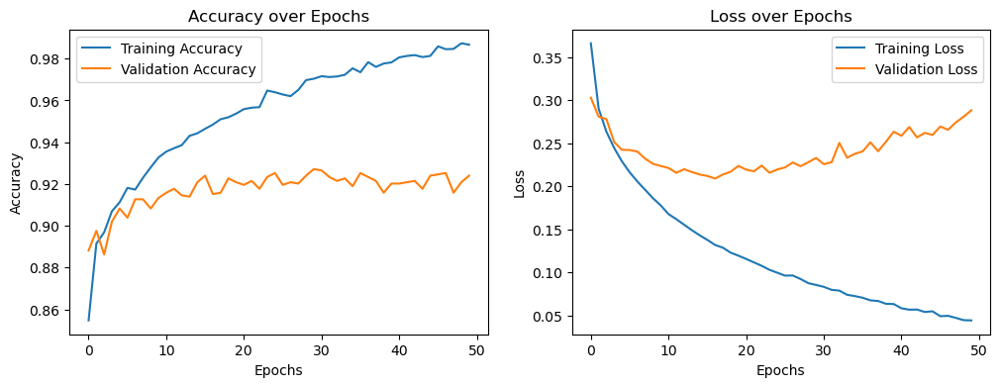

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step
Classification Report on Test Set:
                   precision    recall  f1-score   support

Existing Customer       0.81      0.71      0.76       260
Attrited Customer       0.95      0.97      0.96      1332

         accuracy                           0.93      1592
        macro avg       0.88      0.84      0.86      1592
     weighted avg       0.92      0.93      0.92      1592

Confusion Matrix on Test Set:
[[ 185   75]
 [  43 1289]]


In [125]:
from tensorflow import keras
from tensorflow.keras import layers

# Assuming you already have your data loaded in the following variables
# X_train_final, y_train, X_val_final, y_val, X_test_final, y_test

# Step 2: Preprocess the Data
# Convert labels to binary (0 and 1)
y_train_binary = (y_train != 'Attrited Customer').astype(int)
y_val_binary = (y_val != 'Attrited Customer').astype(int)
y_test_binary = (y_test != 'Attrited Customer').astype(int)

# Step 3: Build the Neural Network
model = keras.Sequential([
    layers.Input(shape=(X_train_final.shape[1],)),  # Input layer with number of features
    layers.Dense(64, activation='relu'),              # Hidden layer 1 with 64 units
    layers.Dense(32, activation='relu'),              # Hidden layer 2 with 32 units
    layers.Dense(1, activation='sigmoid')             # Output layer for binary classification
])

# Step 4: Compile the Model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Step 5: Train the Model
history = model.fit(X_train_final, y_train_binary,
                    validation_data=(X_val_final, y_val_binary),
                    epochs=50,                  # Number of epochs
                    batch_size=32,             # Batch size
                    verbose=1)                 # Show progress

# Step 6: Validate the Model
y_val_pred_prob = model.predict(X_val_final)
y_val_pred = (y_val_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

# Print classification report for validation set
print("Classification Report on Validation Set:")
print(classification_report(y_val_binary, y_val_pred, target_names=['Existing Customer', 'Attrited Customer']))

# Confusion Matrix for the validation set
val_cm = confusion_matrix(y_val_binary, y_val_pred)
print("Confusion Matrix on Validation Set:")
print(val_cm)

# Optional: Plotting the training history
plt.figure(figsize=(12, 4))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Step 7: Test the Model
y_test_pred_prob = model.predict(X_test_final)
y_test_pred = (y_test_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

# Print classification report for the test set
print("Classification Report on Test Set:")
print(classification_report(y_test_binary, y_test_pred, target_names=['Existing Customer', 'Attrited Customer']))

# Confusion Matrix for the test set
test_cm = confusion_matrix(y_test_binary, y_test_pred)
print("Confusion Matrix on Test Set:")
print(test_cm)

Epoch 1/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7390 - loss: 0.6244 - val_accuracy: 0.8417 - val_loss: 0.4241
Epoch 2/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - accuracy: 0.8493 - loss: 0.4393 - val_accuracy: 0.8775 - val_loss: 0.3867
Epoch 3/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - accuracy: 0.8766 - loss: 0.3961 - val_accuracy: 0.8894 - val_loss: 0.3667
Epoch 4/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - accuracy: 0.8806 - loss: 0.3778 - val_accuracy: 0.8894 - val_loss: 0.3524
Epoch 5/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - accuracy: 0.8867 - loss: 0.3580 - val_accuracy: 0.8945 - val_loss: 0.3425
Epoch 6/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - accuracy: 0.8782 - loss: 0.3684 - val_accuracy: 0.8964 - val_loss: 0.3295
Epoch 7/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - accuracy: 0.8857 - loss: 0.3480 - val_accuracy: 0.8926 - val_loss: 0.3215
Epoch 8/50
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - accuracy: 0.8925 - loss: 0.3304 - va

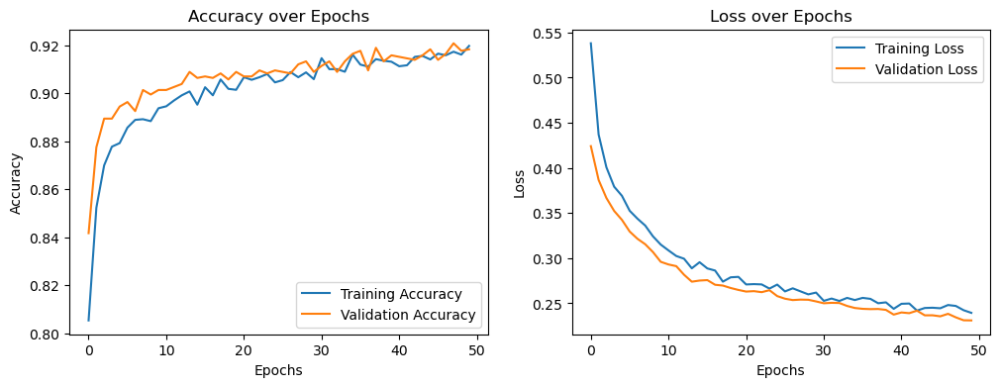

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 596us/step
Classification Report on Test Set:
                   precision    recall  f1-score   support

Existing Customer       0.84      0.65      0.73       260
Attrited Customer       0.93      0.98      0.95      1332

         accuracy                           0.92      1592
        macro avg       0.89      0.81      0.84      1592
     weighted avg       0.92      0.92      0.92      1592

Confusion Matrix on Test Set:
[[ 168   92]
 [  32 1300]]


In [129]:
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

# Step 3: Build the Neural Network
neur_model = keras.Sequential([
    layers.Input(shape=(X_train_final.shape[1],)),  # Input layer
    layers.Dense(64, activation='relu', kernel_regularizer=keras.regularizers.l2(0.001)),  # L2 Regularization
    layers.Dropout(0.5),                              # Dropout layer to reduce overfitting
    layers.Dense(32, activation='relu', kernel_regularizer=keras.regularizers.l2(0.001)),  # L2 Regularization
    layers.Dropout(0.5),                              # Dropout layer
    layers.Dense(1, activation='sigmoid')             # Output layer for binary classification
])

# Step 4: Compile the Model
neur_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Step 5: Train the Model with Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = neur_model.fit(X_train_final, y_train_binary,
                    validation_data=(X_val_final, y_val_binary),
                    epochs=50,                  # Number of epochs
                    batch_size=32,             # Batch size
                    verbose=1,                 # Show progress
                    callbacks=[early_stopping]) # Use early stopping

# Step 6: Validate the Model
y_val_pred_prob = neur_model.predict(X_val_final)
y_val_pred = (y_val_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

# Print classification report for validation set
print("Classification Report on Validation Set:")
print(classification_report(y_val_binary, y_val_pred, target_names=['Existing Customer', 'Attrited Customer']))

# Confusion Matrix for the validation set
val_cm = confusion_matrix(y_val_binary, y_val_pred)
print("Confusion Matrix on Validation Set:")
print(val_cm)

# Optional: Plotting the training history
plt.figure(figsize=(12, 4))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Step 7: Test the Model
y_test_pred_prob = neur_model.predict(X_test_final)
y_test_pred = (y_test_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

# Print classification report for the test set
print("Classification Report on Test Set:")
print(classification_report(y_test_binary, y_test_pred, target_names=['Existing Customer', 'Attrited Customer']))

# Confusion Matrix for the test set
test_cm = confusion_matrix(y_test_binary, y_test_pred)
print("Confusion Matrix on Test Set:")
print(test_cm)

In [128]:
unknown_pred_prob = model.predict(X_unknown_final)
# Using a threshold of 0.5
unknown_pred_labels = (unknown_pred_prob < 0.5).astype(int) 
# Create a mapping from binary labels to original labels
label_mapping = {0: 'Existing Customer', 1: 'Attrited Customer'}
predicted_labels = [label_mapping[label[0]] for label in unknown_pred_labels]

# If you want to create a DataFrame to store predictions
Unknown_data_predictions_neur = pd.DataFrame({
    'Predicted_Probability': unknown_pred_prob.flatten(),
    'Predicted_Label': predicted_labels
})

# Display the predictions
print(Unknown_data_predictions_neur.head())  # Show first few predictions


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
   Predicted_Probability    Predicted_Label
0               0.981560  Existing Customer
1               0.978386  Existing Customer
2               0.027211  Attrited Customer
3               0.961396  Existing Customer
4               0.882168  Existing Customer


In [145]:
Unknown_data

,Attrition_Flag,Predicted_Probability
0,Existing Customer,0.959815
1,Existing Customer,0.863884
2,Attrited Customer,0.123885
3,Existing Customer,0.869467
4,Attrited Customer,0.802432
...,...,...
95,Existing Customer,0.965839
96,Existing Customer,0.921887
97,Existing Customer,0.995131
98,Attrited Customer,0.774683


In [146]:
Unknown_data_predictions_neur

,Predicted_Probability,Predicted_Label
0,0.981560,Existing Customer
1,0.978386,Existing Customer
2,0.027211,Attrited Customer
3,0.961396,Existing Customer
4,0.882168,Existing Customer
...,...,...
95,0.950766,Existing Customer
96,0.962395,Existing Customer
97,0.995238,Existing Customer
98,0.932221,Existing Customer


In [149]:
unknown_pred_prob_rf = grid_search_rf.predict_proba(X_unknown_final)[:, 1]  # Extract probability of positive class (Attrited Customer)

# Step 3: Convert Probabilities to Labels
# Using a threshold of 0.5 by default
unknown_pred_labels_rf = (unknown_pred_prob_rf > 0.5).astype(int)  # 1 for 'Attrited Customer', 0 for 'Existing Customer'

# Step 4: Map the Binary Predictions to Original Labels
# Create a mapping from binary labels to original labels
label_mapping_rf = {1: 'Existing Customer', 0: 'Attrited Customer'}
predicted_labels_rf = [label_mapping_rf[label] for label in unknown_pred_labels_rf]

# Step 5: Add Predictions to DataFrame (if needed)
# If you want to create a DataFrame to store predictions
Unknown_data_predictions_rf = pd.DataFrame({
    'Predicted_Probability': unknown_pred_prob_rf,
    'Predicted_Label': predicted_labels_rf
})

# Display the predictions
print(Unknown_data_predictions_rf.head())  # Show first few predictions

   Predicted_Probability    Predicted_Label
0               0.996667  Existing Customer
1               1.000000  Existing Customer
2               0.051667  Attrited Customer
3               1.000000  Existing Customer
4               0.980833  Existing Customer


In [150]:
Unknown_data_predictions_rf

,Predicted_Probability,Predicted_Label
0,0.996667,Existing Customer
1,1.000000,Existing Customer
2,0.051667,Attrited Customer
3,1.000000,Existing Customer
4,0.980833,Existing Customer
...,...,...
95,0.168333,Attrited Customer
96,0.985000,Existing Customer
97,0.995000,Existing Customer
98,0.965833,Existing Customer


In [153]:
# Combine predictions into a single DataFrame for comparison
comparison_df = pd.DataFrame({
    'Logistic_Regression': Unknown_data['Attrition_Flag'],
    'Neural_Network': Unknown_data_predictions_neur['Predicted_Label'],
    'Random_Forest': Unknown_data_predictions_rf['Predicted_Label']
})

# Display the first few rows of the comparison
print(comparison_df.head())

# Step 1: Compare whether all models agree on their predictions
comparison_df['Agree'] = (comparison_df['Logistic_Regression'] == comparison_df['Neural_Network']) & \
                         (comparison_df['Neural_Network'] == comparison_df['Random_Forest'])

agreement_count = comparison_df['Agree'].sum()
disagreement_count = len(comparison_df) - agreement_count

print(f"Models agree on {agreement_count} predictions and disagree on {disagreement_count} predictions.")

# Optional: View where the models disagree
disagreements = comparison_df[comparison_df['Agree'] == False]
print("Disagreements between models:")
print(disagreements)


  Logistic_Regression     Neural_Network      Random_Forest
0   Existing Customer  Existing Customer  Existing Customer
1   Existing Customer  Existing Customer  Existing Customer
2   Attrited Customer  Attrited Customer  Attrited Customer
3   Existing Customer  Existing Customer  Existing Customer
4   Attrited Customer  Existing Customer  Existing Customer
Models agree on 75 predictions and disagree on 25 predictions.
Disagreements between models:
   Logistic_Regression     Neural_Network      Random_Forest  Agree
4    Attrited Customer  Existing Customer  Existing Customer  False
5    Attrited Customer  Existing Customer  Existing Customer  False
17   Attrited Customer  Existing Customer  Existing Customer  False
22   Attrited Customer  Attrited Customer  Existing Customer  False
25   Attrited Customer  Existing Customer  Existing Customer  False
30   Attrited Customer  Existing Customer  Existing Customer  False
33   Attrited Customer  Existing Customer  Attrited Customer  False
35 

   LR_Probability  NN_Probability  RF_Probability
0        0.959815        0.981560        0.996667
1        0.863884        0.978386        1.000000
2        0.123885        0.027211        0.051667
3        0.869467        0.961396        1.000000
4        0.802432        0.882168        0.980833
       LR_Probability  NN_Probability  RF_Probability
count      100.000000      100.000000      100.000000
mean         0.830051        0.817393        0.794317
std          0.234932        0.307060        0.359853
min          0.123885        0.017715        0.000000
25%          0.815125        0.876958        0.900625
50%          0.933082        0.969643        0.983750
75%          0.973265        0.992965        0.995000
max          0.999439        0.999959        1.000000


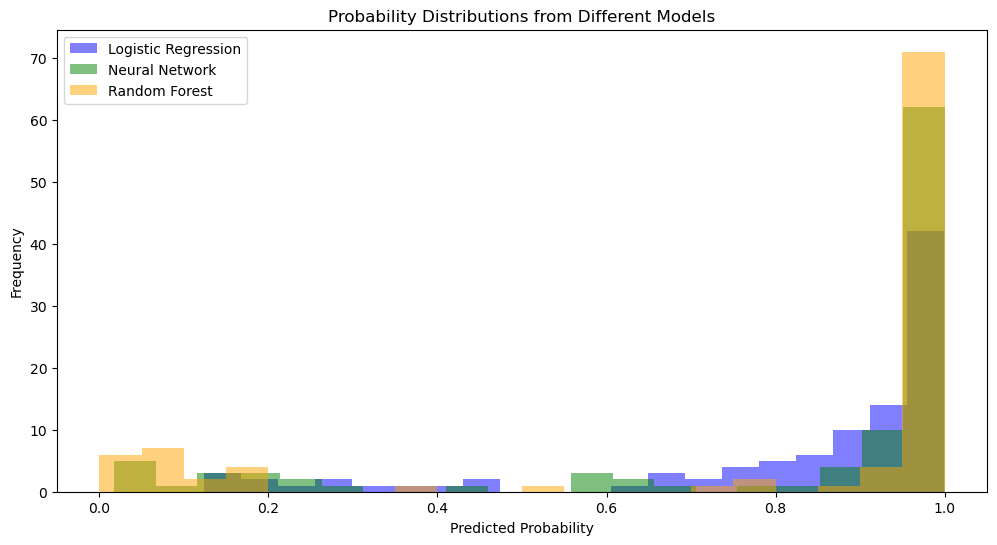

In [154]:
# Combine the predicted probabilities from all models
prob_comparison_df = pd.DataFrame({
    'LR_Probability': Unknown_data['Predicted_Probability'],
    'NN_Probability': Unknown_data_predictions_neur['Predicted_Probability'],
    'RF_Probability': Unknown_data_predictions_rf['Predicted_Probability']
})

# Display the first few rows of the comparison
print(prob_comparison_df.head())

# Check summary statistics for each model's probabilities
print(prob_comparison_df.describe())

# Plot comparison of probabilities using histograms
plt.figure(figsize=(12, 6))
plt.hist(prob_comparison_df['LR_Probability'], bins=20, alpha=0.5, label='Logistic Regression', color='blue')
plt.hist(prob_comparison_df['NN_Probability'], bins=20, alpha=0.5, label='Neural Network', color='green')
plt.hist(prob_comparison_df['RF_Probability'], bins=20, alpha=0.5, label='Random Forest', color='orange')
plt.title('Probability Distributions from Different Models')
plt.xlabel('Predicted Probability')
plt.ylabel('Frequency')
plt.legend(loc='best')
plt.show()


In [155]:
# Step 1: Define a majority vote function
def majority_vote(row):
    votes = [row['Logistic_Regression'], row['Neural_Network'], row['Random_Forest']]
    return max(set(votes), key=votes.count)  # Returns the most common vote

# Step 2: Apply the majority voting to the comparison DataFrame
comparison_df['Majority_Vote'] = comparison_df.apply(majority_vote, axis=1)

# Display the first few rows with the majority vote
print(comparison_df.head())


  Logistic_Regression     Neural_Network      Random_Forest  Agree  \
0   Existing Customer  Existing Customer  Existing Customer   True   
1   Existing Customer  Existing Customer  Existing Customer   True   
2   Attrited Customer  Attrited Customer  Attrited Customer   True   
3   Existing Customer  Existing Customer  Existing Customer   True   
4   Attrited Customer  Existing Customer  Existing Customer  False   

       Majority_Vote  
0  Existing Customer  
1  Existing Customer  
2  Attrited Customer  
3  Existing Customer  
4  Existing Customer  


50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 607us/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step


C:\Users\lenovo\AppData\Local\Temp\ipykernel_10988\749325420.py:36: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  y_val_pred_majority = stats.mode(val_predictions, axis=0)[0][0]
C:\Users\lenovo\AppData\Local\Temp\ipykernel_10988\749325420.py:37: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or Fal

<Figure size 600x600 with 0 Axes>

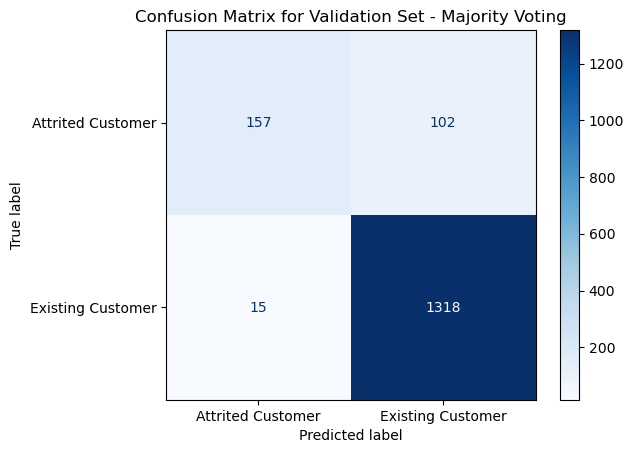

<Figure size 600x600 with 0 Axes>

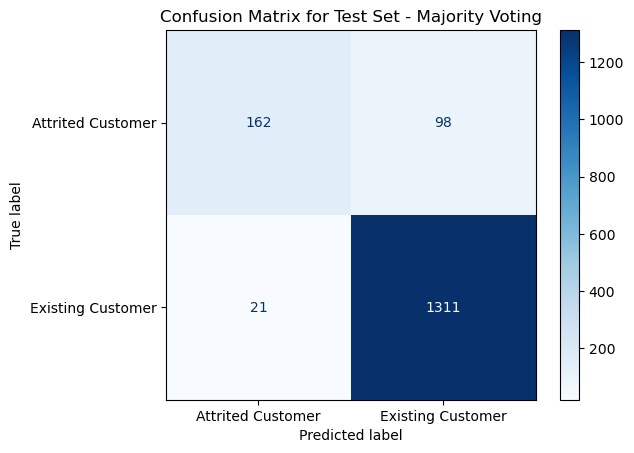

In [169]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Step 1: Predict using the three models for validation and test sets
# Logistic Regression
y_val_pred_prob_lr = grid_search_lr.predict_proba(X_val_final)[:, 1]
y_test_pred_prob_lr = grid_search_lr.predict_proba(X_test_final)[:, 1]

y_val_pred_lr = (y_val_pred_prob_lr < 0.5).astype(int)
y_test_pred_lr = (y_test_pred_prob_lr < 0.5).astype(int)

# Random Forest
y_val_pred_prob_rf = grid_search_rf.predict_proba(X_val_final)[:, 1]
y_test_pred_prob_rf = grid_search_rf.predict_proba(X_test_final)[:, 1]

y_val_pred_rf = (y_val_pred_prob_rf < 0.5).astype(int)
y_test_pred_rf = (y_test_pred_prob_rf < 0.5).astype(int)

# Neural Network
y_val_pred_prob_neur = neur_model.predict(X_val_final)
y_test_pred_prob_neur = neur_model.predict(X_test_final)

y_val_pred_neur = (y_val_pred_prob_neur < 0.5).astype(int)
y_test_pred_neur = (y_test_pred_prob_neur < 0.5).astype(int)

y_val_pred_neur = y_val_pred_neur.flatten()
y_test_pred_neur = y_test_pred_neur.flatten()
# Step 2: Majority Voting for Validation and Test sets
import numpy as np
from scipy import stats

# Combine predictions from the three models (Logistic Regression, Random Forest, Neural Network)
val_predictions = np.array([y_val_pred_lr, y_val_pred_rf, y_val_pred_neur])
test_predictions = np.array([y_test_pred_lr, y_test_pred_rf, y_test_pred_neur])

# Perform majority voting
y_val_pred_majority = stats.mode(val_predictions, axis=0)[0][0]
y_test_pred_majority = stats.mode(test_predictions, axis=0)[0][0]

# Step 1: Map the predictions from 0/1 to the correct string labels
label_mapping = {0: 'Existing Customer', 1: 'Attrited Customer'}

# Convert majority voting predictions for validation set from 0/1 to string labels
y_val_pred_majority_str = np.vectorize(label_mapping.get)(y_val_pred_majority)

# Convert majority voting predictions for test set from 0/1 to string labels
y_test_pred_majority_str = np.vectorize(label_mapping.get)(y_test_pred_majority)

# Step 2: Compare with true labels and build confusion matrices

# For Validation Set
val_cm = confusion_matrix(y_val, y_val_pred_majority_str)
disp_val_cm = ConfusionMatrixDisplay(confusion_matrix=val_cm, display_labels=['Attrited Customer', 'Existing Customer'])

# For Test Set
test_cm = confusion_matrix(y_test, y_test_pred_majority_str)
disp_test_cm = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=['Attrited Customer', 'Existing Customer'])

# Step 3: Plot the confusion matrices
import matplotlib.pyplot as plt

# Plot for Validation
plt.figure(figsize=(6, 6))
disp_val_cm.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Validation Set - Majority Voting')
plt.show()

# Plot for Test
plt.figure(figsize=(6, 6))
disp_test_cm.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Test Set - Majority Voting')
plt.show()

<Figure size 600x600 with 0 Axes>

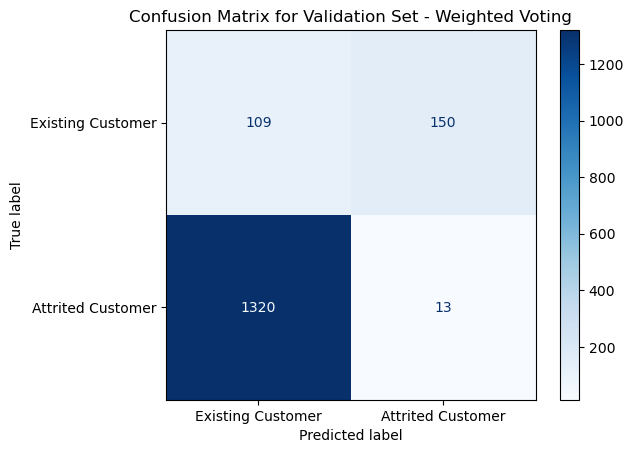

<Figure size 600x600 with 0 Axes>

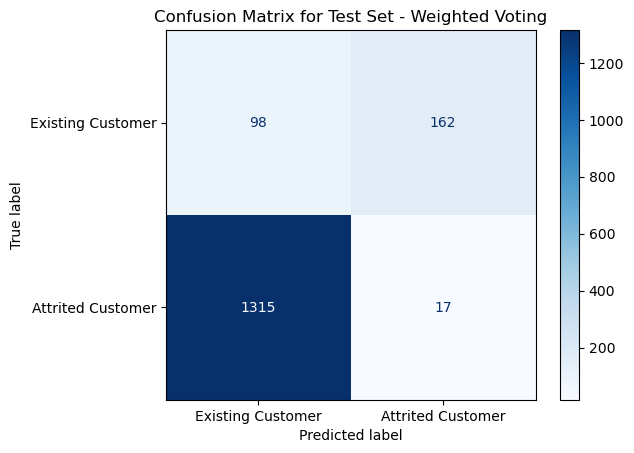

In [170]:
from sklearn.metrics import accuracy_score

# Step 1: Evaluate individual model performance on validation set
# Assuming binary classification (0 = Existing Customer, 1 = Attrited Customer)

# Logistic Regression performance
val_acc_lr = accuracy_score(y_val, np.vectorize(label_mapping.get)(y_val_pred_lr))

# Random Forest performance
val_acc_rf = accuracy_score(y_val, np.vectorize(label_mapping.get)(y_val_pred_rf))

# Neural Network performance
val_acc_neur = accuracy_score(y_val, np.vectorize(label_mapping.get)(y_val_pred_neur.flatten()))

# Assign weights based on performance (higher accuracy = higher weight)
# Normalize the weights so they sum to 1
total_acc = val_acc_lr + val_acc_rf + val_acc_neur
weights = {
    'lr': val_acc_lr / total_acc,
    'rf': val_acc_rf / total_acc,
    'neur': val_acc_neur / total_acc
}

# Step 2: Perform weighted voting
# Use predicted probabilities and multiply by model weights
val_prob_weighted = (
    weights['lr'] * y_val_pred_prob_lr +
    weights['rf'] * y_val_pred_prob_rf +
    weights['neur'] * y_val_pred_prob_neur.flatten()
)

# For the test set
test_prob_weighted = (
    weights['lr'] * y_test_pred_prob_lr +
    weights['rf'] * y_test_pred_prob_rf +
    weights['neur'] * y_test_pred_prob_neur.flatten()
)

# Step 3: Convert weighted probabilities to binary labels (0 or 1)
# Using 0.5 as the threshold
y_val_pred_weighted = (val_prob_weighted > 0.5).astype(int)
y_test_pred_weighted = (test_prob_weighted > 0.5).astype(int)

# Step 4: Map the predictions back to string labels
y_val_pred_weighted_str = np.vectorize(label_mapping.get)(y_val_pred_weighted)
y_test_pred_weighted_str = np.vectorize(label_mapping.get)(y_test_pred_weighted)

# Step 5: Compare with true labels and build confusion matrices

# For Validation Set
val_cm_weighted = confusion_matrix(y_val, y_val_pred_weighted_str)
disp_val_cm_weighted = ConfusionMatrixDisplay(confusion_matrix=val_cm_weighted, display_labels=['Existing Customer', 'Attrited Customer'])

# For Test Set
test_cm_weighted = confusion_matrix(y_test, y_test_pred_weighted_str)
disp_test_cm_weighted = ConfusionMatrixDisplay(confusion_matrix=test_cm_weighted, display_labels=['Existing Customer', 'Attrited Customer'])

# Step 6: Plot the confusion matrices

# Plot for Validation
plt.figure(figsize=(6, 6))
disp_val_cm_weighted.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Validation Set - Weighted Voting')
plt.show()

# Plot for Test
plt.figure(figsize=(6, 6))
disp_test_cm_weighted.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Test Set - Weighted Voting')
plt.show()


c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value f

<Figure size 600x600 with 0 Axes>

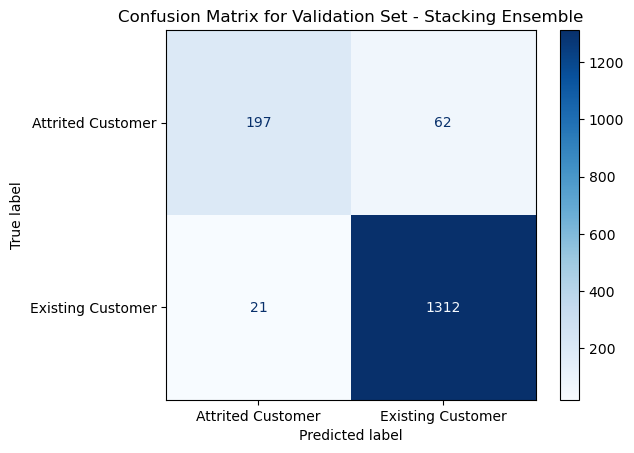

Text(0.5, 1.0, 'Confusion Matrix for Test Set - Stacking Ensemble')

<Figure size 600x600 with 0 Axes>

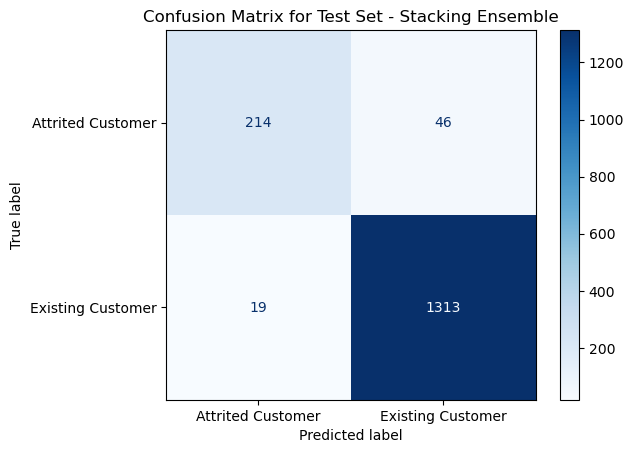

In [174]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Step 1: Create the base models
estimators = [
    ('lr', grid_search_lr.best_estimator_),  # Logistic Regression model from grid search
    ('rf', grid_search_rf.best_estimator_)  # Random Forest model from grid search
]

# Step 2: Define the stacking classifier with a logistic regression as the meta-model
stacking_clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

# Step 3: Train the stacking classifier using the validation data
stacking_clf.fit(X_train_final, y_train)

# Step 4: Predict on the validation and test sets
y_val_pred_stack = stacking_clf.predict(X_val_final)
y_test_pred_stack = stacking_clf.predict(X_test_final)

# Step 5: Create confusion matrices for both validation and test sets

# For Validation Set
val_cm_stack = confusion_matrix(y_val, y_val_pred_stack)
disp_val_cm_stack = ConfusionMatrixDisplay(confusion_matrix=val_cm_stack, display_labels=['Attrited Customer', 'Existing Customer'])

# For Test Set
test_cm_stack = confusion_matrix(y_test, y_test_pred_stack)
disp_test_cm_stack = ConfusionMatrixDisplay(confusion_matrix=test_cm_stack, display_labels=['Attrited Customer', 'Existing Customer'])

# Step 6: Plot the confusion matrices

# Plot for Validation
plt.figure(figsize=(6, 6))
disp_val_cm_stack.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Validation Set - Stacking Ensemble')
plt.show()

# Plot for Test
plt.figure(figsize=(6, 6))
disp_test_cm_stack.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Test Set - Stacking Ensemble')


c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\lenovo\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value f

<Figure size 600x600 with 0 Axes>

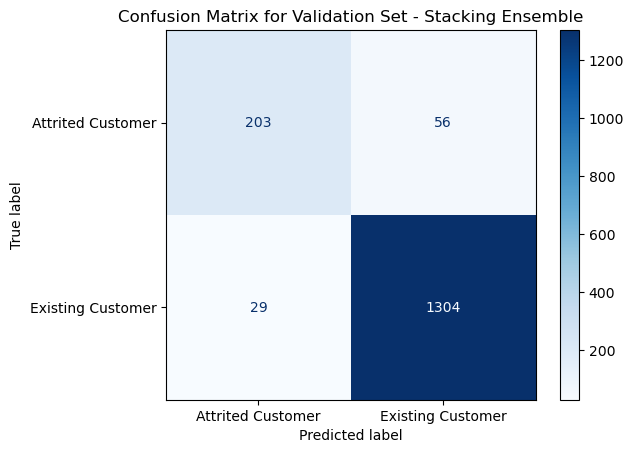

Text(0.5, 1.0, 'Confusion Matrix for Test Set - Stacking Ensemble')

<Figure size 600x600 with 0 Axes>

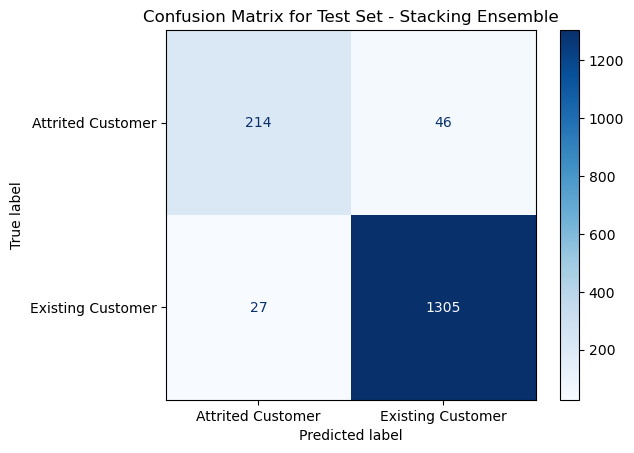

In [175]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Step 1: Create the base models
estimators = [
    ('lr', grid_search_lr.best_estimator_),  # Logistic Regression model from grid search
    ('rf', grid_search_rf.best_estimator_)  # Random Forest model from grid search
]

# Step 2: Define the stacking classifier with a logistic regression as the meta-model
stacking_clf = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier())

# Step 3: Train the stacking classifier using the validation data
stacking_clf.fit(X_train_final, y_train)

# Step 4: Predict on the validation and test sets
y_val_pred_stack = stacking_clf.predict(X_val_final)
y_test_pred_stack = stacking_clf.predict(X_test_final)

# Step 5: Create confusion matrices for both validation and test sets

# For Validation Set
val_cm_stack = confusion_matrix(y_val, y_val_pred_stack)
disp_val_cm_stack = ConfusionMatrixDisplay(confusion_matrix=val_cm_stack, display_labels=['Attrited Customer', 'Existing Customer'])

# For Test Set
test_cm_stack = confusion_matrix(y_test, y_test_pred_stack)
disp_test_cm_stack = ConfusionMatrixDisplay(confusion_matrix=test_cm_stack, display_labels=['Attrited Customer', 'Existing Customer'])

# Step 6: Plot the confusion matrices

# Plot for Validation
plt.figure(figsize=(6, 6))
disp_val_cm_stack.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Validation Set - Stacking Ensemble')
plt.show()

# Plot for Test
plt.figure(figsize=(6, 6))
disp_test_cm_stack.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix for Test Set - Stacking Ensemble')